In [1]:
from sklearn.cluster import KMeans
import numpy as np
from torch.utils.data import DataLoader, Dataset
import torchvision.datasets as datasets
import torchvision.transforms as transforms
import torch
from torch.utils.data import Subset
import time
import torchvision.models as models
from matplotlib import pyplot as plt

/home/pl2285/miniconda3/lib/python3.10/site-packages/torchvision/io/image.py:13: UserWarning: Failed to load image Python extension: 'libc10_hip.so: cannot open shared object file: No such file or directory'If you don't plan on using image functionality from `torchvision.io`, you can ignore this warning. Otherwise, there might be something wrong with your environment. Did you have `libjpeg` or `libpng` installed before building `torchvision` from source?
  warn(


In [2]:
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
train_dataset = datasets.ImageFolder(
    "/mnt/wwn-0x5000c500e421004a/yy2694/datasets/saycam/tc/train",
    transforms.Compose([
        transforms.ToTensor(),
        normalize
    ])
)

In [3]:
class_to_idx = {k: v for (k, v) in train_dataset.class_to_idx.items() if k.startswith("A")}
train_idx = [i for i in range(len(train_dataset)) if train_dataset.imgs[i][1] in class_to_idx.values()]
train_dataset = Subset(train_dataset, train_idx)
train_dataset.class_to_idx = class_to_idx

In [4]:
def visualize_temporal_clusters(cluster_list):
    #sorted_clusters = sort_clusters(cluster_list)
    n_clusters = max(cluster_list) + 1
    n_frames = len(cluster_list)

    plt.figure(figsize=(15, 5))
    plt.title("Temporal Clusters in Video")
    plt.xlabel("Frame")
    plt.ylabel("Cluster")
    plt.yticks(range(n_clusters))
    plt.xlim(0, n_frames)
    
    for i, cluster in enumerate(cluster_list):
        plt.plot([i, i + 1], [cluster, cluster], linewidth=4, color=plt.cm.get_cmap("tab20")(cluster))
    
    plt.show()

/tmp/ipykernel_7542/2913570327.py:14: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  plt.plot([i, i + 1], [cluster, cluster], linewidth=4, color=plt.cm.get_cmap("tab20")(cluster))


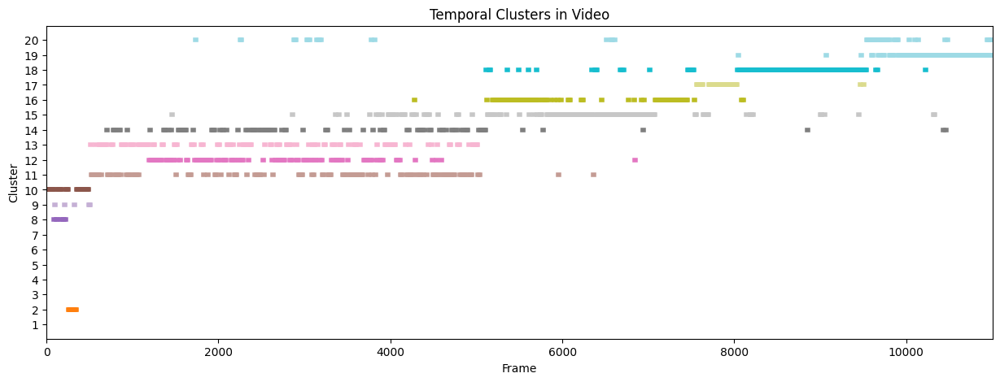

In [42]:
A = torch.load('experiments/resnet50_64_True_A_5_288_04302023_152852_19_2.5/cluster_0.tar')
#A = [train_dataset.dataset.imgs[i][1] for i in range(len(train_dataset))]
#A = torch.tensor(A)
B = A[torch.linspace(10999, 21999, 11000).long()]
#print(len(B))
#plt.bar(range(len(B)), B + 1)
visualize_temporal_clusters(list(B + 1))

/tmp/ipykernel_7542/2913570327.py:14: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  plt.plot([i, i + 1], [cluster, cluster], linewidth=4, color=plt.cm.get_cmap("tab20")(cluster))


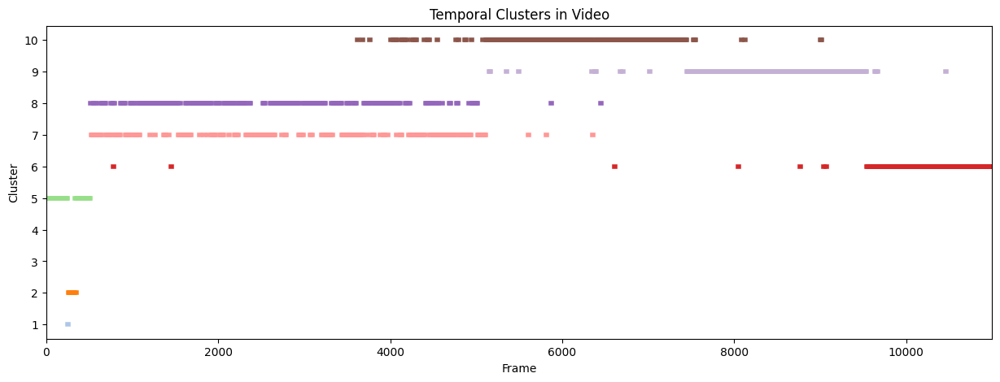

In [43]:
A = torch.load('experiments/resnet50_64_True_A_5_288_04302023_232114_19_2.5/cluster_0.tar')
#A = [train_dataset.dataset.imgs[i][1] for i in range(len(train_dataset))]
#A = torch.tensor(A)
B = A[torch.linspace(10999, 21999, 11000).long()]
#print(len(B))
#plt.bar(range(len(B)), B + 1)
visualize_temporal_clusters(list(B + 1))

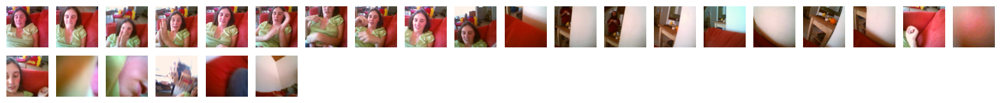

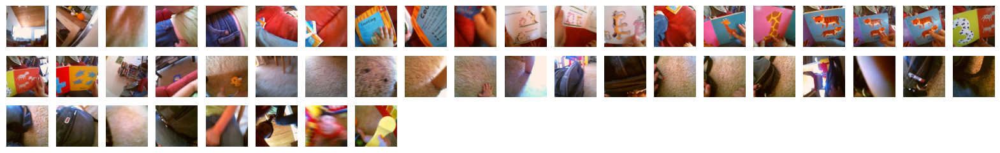

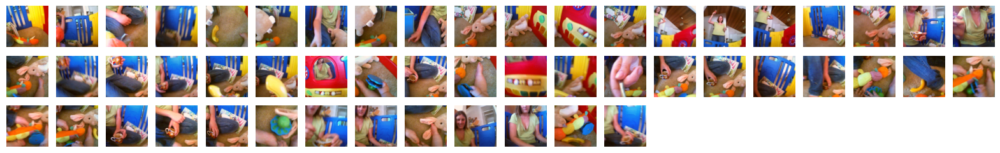

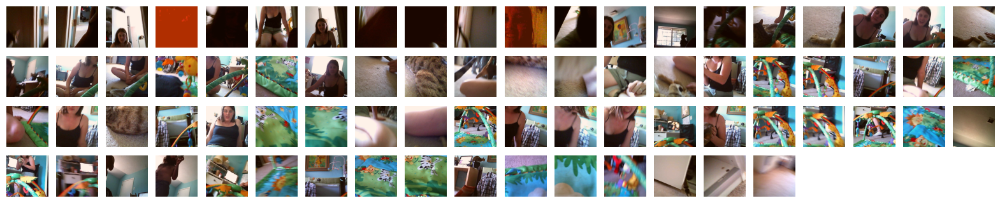

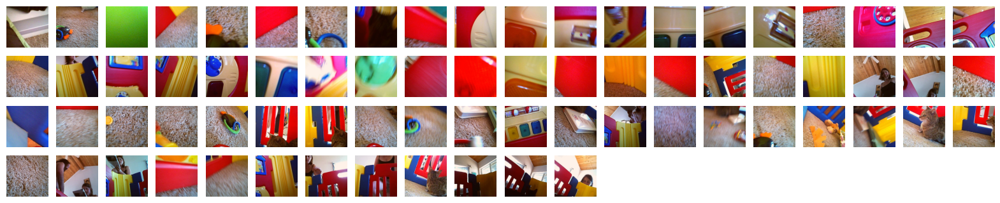

In [41]:
figs = [plt.figure(figsize = (20, 10)) for _ in range(5)]
idx = [1 for _ in range(20)]
for i in range(11000):
    if i % 40 != 0:
        continue
    ax = figs[A[i]].add_subplot(10, 20, idx[A[i]])
    idx[A[i]] += 1
    img = train_dataset.dataset[i][0].permute(1, 2, 0)
    img = (img - torch.min(img)) / (torch.max(img) - torch.min(img))
    ax.imshow(img[:,:,[2,1,0]])
    ax.axis('off')
    #ax.set_title(i)
plt.show()

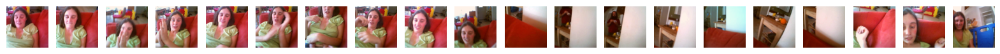

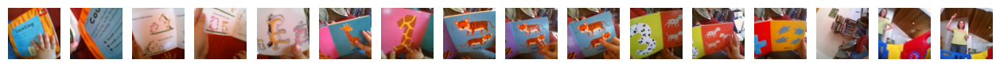

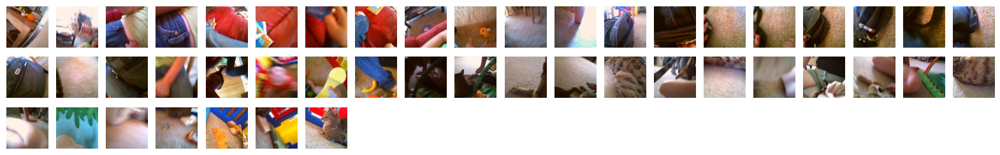

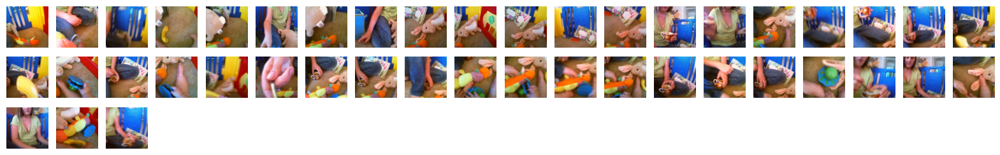

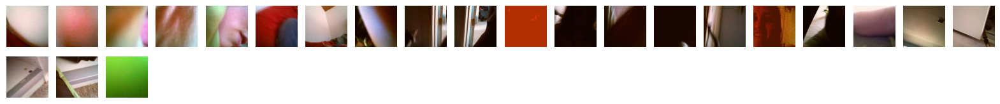

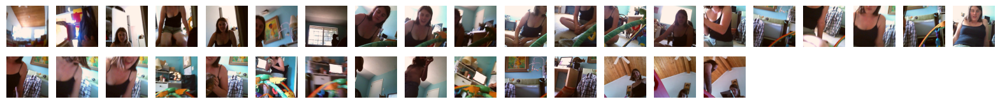

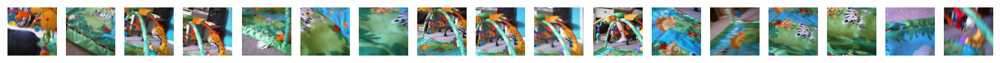

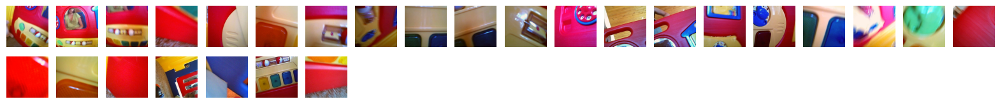

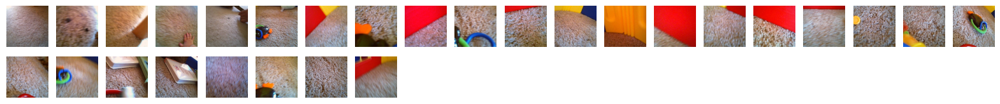

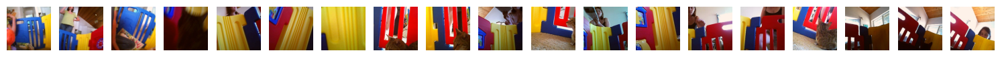

In [198]:
figs = [plt.figure(figsize = (20, 5)) for _ in range(10)]
idx = [1 for _ in range(10)]
for i in range(11000):
    if i % 40 != 0:
        continue
    ax = figs[A[i]].add_subplot(5, 20, idx[A[i]])
    idx[A[i]] += 1
    img = train_dataset.dataset[i][0].permute(1, 2, 0)
    img = (img - torch.min(img)) / (torch.max(img) - torch.min(img))
    ax.imshow(img[:,:,[2,1,0]])
    ax.axis('off')
    #ax.set_title(i)
plt.show()

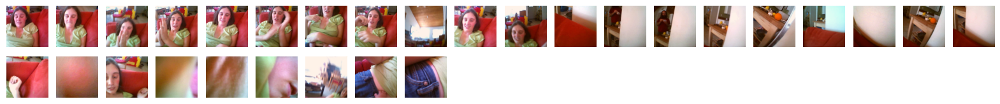

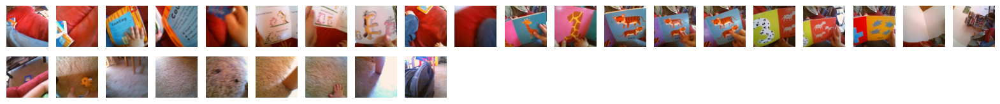

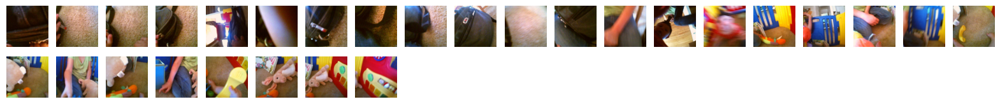

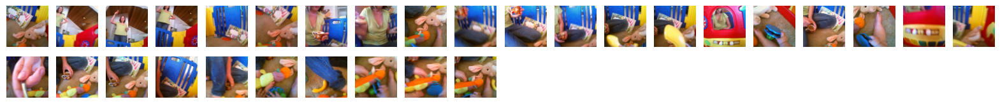

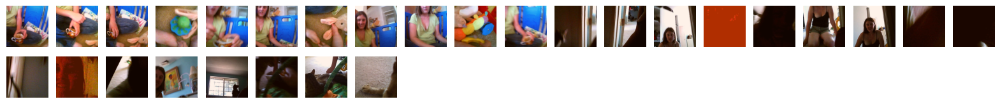

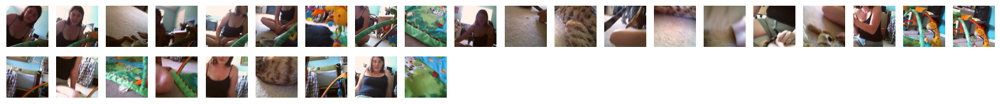

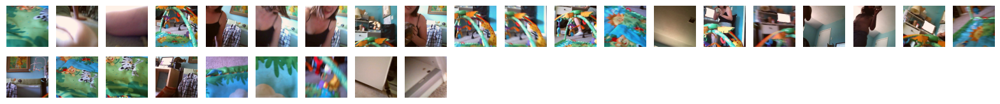

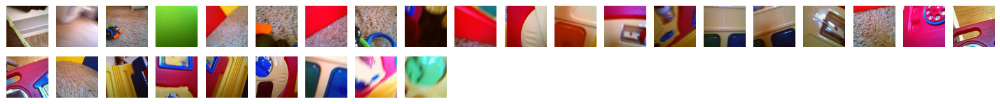

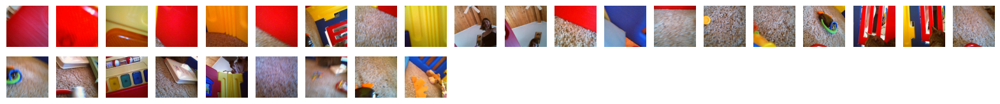

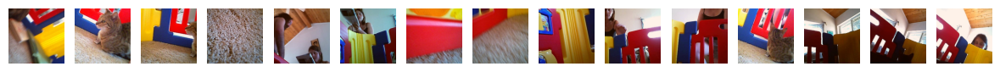

In [109]:
figs = [plt.figure(figsize = (20, 5)) for _ in range(10)]
idx = [1 for _ in range(10)]
for i in range(11000):
    if i % 40 != 0:
        continue
    ax = figs[A[i]].add_subplot(5, 20, idx[A[i]])
    idx[A[i]] += 1
    img = train_dataset.dataset[i][0].permute(1, 2, 0)
    img = (img - torch.min(img)) / (torch.max(img) - torch.min(img))
    ax.imshow(img[:,:,[2,1,0]])
    ax.axis('off')
    #ax.set_title(i)
plt.show()

In [277]:
for i in range(1):
    fig = plt.figure(figsize = (20, 20))
    ids = set(torch.where(A==i))
    k = 1
    for idx, (imgs, _) in enumerate(train_dataset):
        if idx > 11000:
            break
        if idx in ids and idx % 100 == 0:
            imgs = (imgs - torch.min(imgs)) / (torch.max(imgs) - torch.min(imgs))
            imgs = imgs.permute(1, 2, 0).cpu().numpy()
            ax = fig.add_subplot(20, 20, k)
            k += 1
            ax.imshow(imgs)
            #ax.set_title(A[idx].item())
            ax.axis('off')
    plt.show()

<Figure size 2000x2000 with 0 Axes>

In [159]:
model = models.resnext50_32x4d(pretrained=True)

/home/pl2285/miniconda3/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/pl2285/miniconda3/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNeXt50_32X4D_Weights.IMAGENET1K_V1`. You can also use `weights=ResNeXt50_32X4D_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [212]:
def KMeans(X, num_clusters = 10, max_iter = 100):
    # Initialize cluster centroids randomly
    centroids = X[torch.randperm(X.shape[0])[:num_clusters]]

    # Loop until convergence or maximum iterations reached
    for i in range(max_iter):
        # Compute distances between each point and each centroid
        distances = torch.cdist(X, centroids)
    
        # Assign each point to the closest centroid
        cluster_labels = torch.argmin(distances, dim=1)
        # Update cluster centroids
        for j in range(num_clusters):
            mask = cluster_labels == j
            if mask.any():
                centroids[j] = X[mask].mean(dim=0)
    return cluster_labels

In [242]:
labels = torch.tensor(list(train_dataset.class_to_idx.values()))
for group in range(int(np.ceil(len(labels) / 10))):
    start = time.time()
    group_labels = labels[torch.linspace(group * 10, (group + 1) * 10 - 1, 10).long()]
    class_to_idx = {k: v for (k, v) in train_dataset.class_to_idx.items() if v in group_labels}
    train_idx = [i for i in range(len(train_dataset.dataset)) if train_dataset.dataset.imgs[i][1] in class_to_idx.values()]
    one_train_dataset = Subset(train_dataset.dataset, train_idx)
    train_loader = torch.utils.data.DataLoader(
        one_train_dataset, batch_size=200, shuffle=False, pin_memory=True)
    rep = []
    for idx, (images, _) in enumerate(train_loader):
        with torch.no_grad():
            output = model.cuda(3)(images.cuda(3))
        output = (output.permute(1, 0) / torch.linalg.norm(output, dim = -1)).permute(1, 0) # (feature_dim, batch_size)
        rep.append(output) 
    rep = torch.vstack(rep) # (num_pts, feature_dim, batch_size) => (batch_size, feature_dim, num_pts)
    targets = KMeans(rep, np.min(((group + 1) * 10, len(labels))) - group * 10).long()
    end = time.time()
    print(group, end - start)

0 22.946183443069458


In [48]:
torch.linalg.norm(torch.ones(200, 1000), dim = -1).shape
torch.vstack([torch.ones(200, 1000) for _ in range(100)]).shape

torch.Size([20000, 1000])

In [19]:
len(train_dataset)

11507

In [148]:
(len(train_dataset.dataset) // 25600) * 200 / 3600

11.555555555555555

In [90]:
def get_labels(train_dataset, group_size):
    if not hasattr(train_dataset, 'dataset'):
        train_dataset = Subset(train_dataset, range(len(train_dataset)))
    num_group = len(train_subset) // group_size + 1
    labels = torch.tensor(())
    for group in range(num_group):
        class_to_idx = {k: v for (k, v) in train_dataset.dataset.class_to_idx.items()\
                    if v in torch.linspace(group * group_size, (group + 1) * group_size - 1, group_size)}
        train_idx = [i for i in range(len(train_dataset)) if train_dataset.dataset.imgs[i][1] in class_to_idx.values()]
        subset = Subset(train_dataset, train_idx)
        labels = torch.concatenate((labels, torch.tensor(\
                np.random.randint(0, group_size, (len(subset),))) + group * group_size))
    return labels

In [91]:
def get_labels(train_dataset, group_size):
    labels = torch.tensor(())
    existing_labels = []
    rep = []
    for idx, (image, label) in enumerate(train_dataset):
        if label not in existing_labels:
            if len(existing_labels) % group_size == 0:
                group = len(existing_labels) // group_size - 1
                rep = np.vstack(rep)
                kmeans = KMeans(n_clusters= args.group_size, random_state=0).fit(rep)
                cur_labels = torch.Tensor(kmeans.labels_).long()
                labels = torch.concatenate((labels, cur_labels + group * group_size))
                rep = []
            existing_labels.append(label)
        if idx % 10000 == 0:
            print(idx, label)
        with torch.no_grad():
            example = model(example.unsqueeze(0).to(device)).squeeze(0).cpu().detach().numpy()
        example = example / np.linalg.norm(example)
        prior = get_prior(label, args.group_size, max(16 - 3 * group, 0))
        example = np.concatenate((example, prior))
        rep.append(example)
    return labels

KeyboardInterrupt: 

In [57]:
torch.tensor(train_dataset.dataset.targets)[..., None] == 0

tensor([[ True],
        [ True],
        [ True],
        ...,
        [False],
        [False],
        [False]])

In [36]:
A = torch.tensor(())
for i in range(10):
    A = torch.concatenate((A, torch.tensor(np.random.randint(0, 3, (10,))) + i * 3))
A

tensor([ 2.,  1.,  2.,  2.,  2.,  0.,  0.,  1.,  0.,  2.,  3.,  3.,  4.,  5.,
         4.,  3.,  3.,  3.,  5.,  5.,  6.,  8.,  7.,  7.,  6.,  8.,  8.,  7.,
         6.,  7., 11., 11.,  9.,  9., 10., 10.,  9., 10.,  9., 10., 14., 12.,
        13., 12., 12., 12., 12., 14., 12., 14., 16., 17., 15., 15., 17., 15.,
        17., 16., 16., 15., 19., 19., 18., 19., 19., 19., 18., 19., 18., 18.,
        22., 23., 21., 22., 21., 21., 23., 23., 21., 23., 26., 26., 24., 24.,
        25., 26., 25., 26., 26., 26., 28., 29., 28., 27., 27., 27., 28., 29.,
        29., 29.])

In [38]:
indices = torch.tensor(train_dataset.targets)[..., None] == -1
for group in range(len(torch.unique(torch.Tensor(train_dataset.targets))) // 5 + 1):
    for i in range(group * 5, (group + 1) * 5):
        indices = torch.logical_or(torch.tensor(train_dataset.targets)[..., None] == i, indices)
    indices = indices.any(-1).nonzero(as_tuple=True)[0]
    print(indices)
    train_subset = torch.utils.data.Subset(train_dataset, indices)

tensor([   0,    1,    2,  ..., 5749, 5750, 5751])


KeyboardInterrupt: 